In [0]:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# 1. Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

    100% |████████████████████████████████| 993kB 29.6MB/s 


In [0]:
file = drive.CreateFile({'id': '1aLon9sOQd49HNV0-Deo2XMwf-49XlL5P'})
file.GetContentFile('data.zip')

In [0]:
!unzip data.zip 

Archive:  data.zip
  inflating: Data/55476674_322416511796132_1602351095823204352_n.jpg  
  inflating: Data/55832979_2062249653884065_3503615044816470016_n.jpg  
  inflating: Data/55845480_2320611051531058_6012257132617924608_n.jpg  
  inflating: Data/55849439_686914108393852_8362249317553012736_n.jpg  
  inflating: Data/55853825_857482511260337_3470078625909309440_n.jpg  
  inflating: Data/55857674_718823635181219_3147382077805035520_n.jpg  
  inflating: Data/55860877_271463770397242_69093057286373376_n.jpg  
  inflating: Data/55865242_1223749437788726_3264283537049649152_n.jpg  
  inflating: Data/55875576_2210603529015398_8631567913318350848_n.jpg  
  inflating: Data/55892391_454099721996543_5620546064999251968_n.jpg  
  inflating: Data/55892466_314342812562092_1632416949226962944_n.jpg  
  inflating: Data/55897096_606816169785987_4540970893727236096_n.jpg  
  inflating: Data/55901788_304087930263526_3514401305424560128_n.jpg  
  inflating: Data/55908384_2500698833327456_249647463013

In [0]:
import cv2
import glob

In [0]:
# from google.colab import files
# uploaded = files.upload()
# for k, v in uploaded.items():
#   open(k, 'wb').write(v)
# list(uploaded.keys())

In [0]:
file_list = list(glob.glob('./Data/*'))
images = [cv2.imread(x) for x in file_list]

In [0]:
import numpy as np
from matplotlib import pyplot as plt

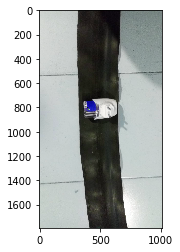

In [0]:
plt.imshow(images[0])

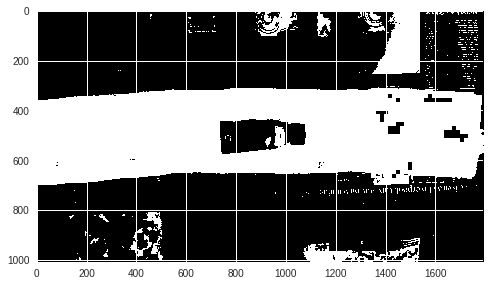

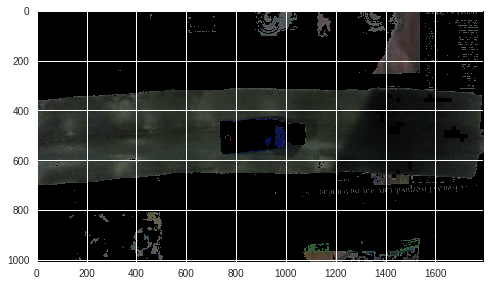

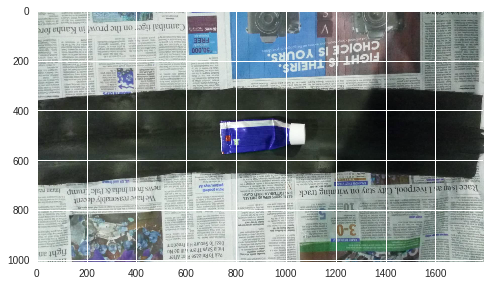

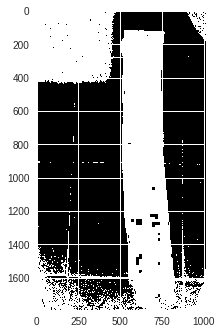

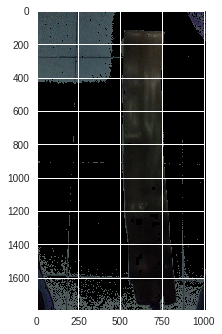

...

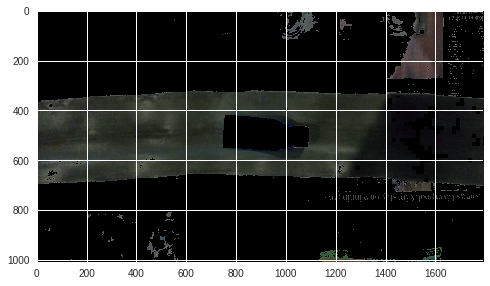

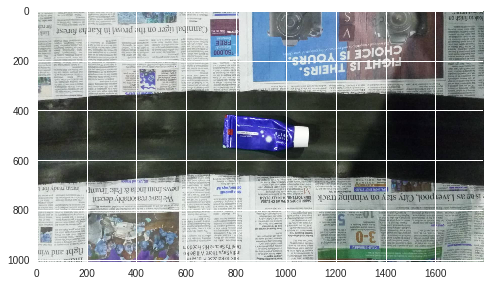

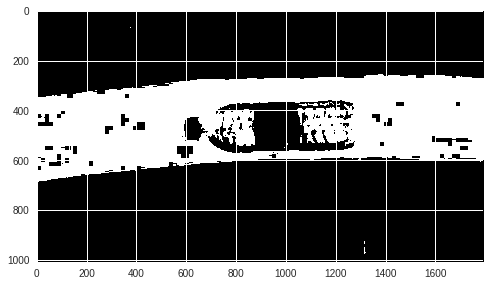

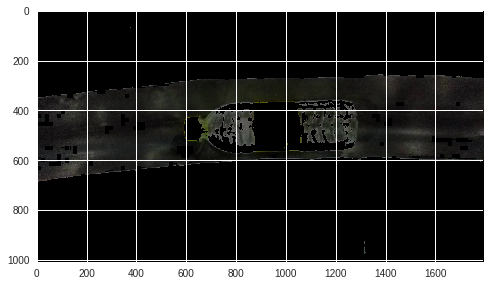

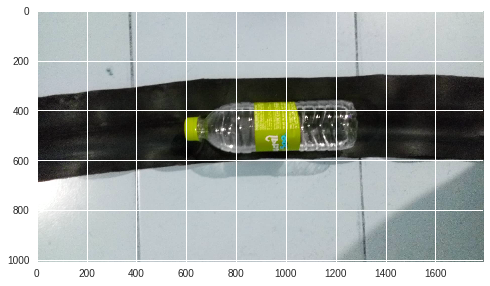

In [0]:
img = images[4]
for img in images:
  hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
  # hsv = cv2.threshold(hsv,127,255,cv2.THRESH_BINARY_INV)

  lower = np.array([1,0,0])
  upper = np.array([255,255,100])


  mask = cv2.inRange(hsv, lower, upper)
  res = cv2.bitwise_and(img,img, mask= mask)

  plt.imshow(255-mask)
  plt.show()
  plt.imshow(res)
  plt.show()
  plt.imshow(img)
  plt.show()

In [0]:
type(res)

numpy.ndarray

In [0]:
!pip install h5py
!pip install -q opencv-python && apt -qq update && apt -qq install -y libsm6 libxext6
!pip install -q keras
!wget "https://cdn.skillenza.com/files/5ee0a2e1-bf6d-4173-8244-e75fa2d7bbe2/training.5k.zip"
!unzip training.5k.zip >/dev/null
!rm training.5k.zip

8 packages can be upgraded. Run 'apt list --upgradable' to see them.
libsm6 is already the newest version (2:1.2.2-1).
libxext6 is already the newest version (2:1.3.3-1).
0 upgraded, 0 newly installed, 0 to remove and 8 not upgraded.
--2019-01-06 07:50:28--  https://cdn.skillenza.com/files/5ee0a2e1-bf6d-4173-8244-e75fa2d7bbe2/training.5k.zip
Resolving cdn.skillenza.com (cdn.skillenza.com)... 52.85.158.170, 52.85.158.159, 52.85.158.226, ...
Connecting to cdn.skillenza.com (cdn.skillenza.com)|52.85.158.170|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 137569412 (131M) [application/zip]
Saving to: ‘training.5k.zip’

training.5k.zip     100%[===================>] 131.20M   149MB/s    in 0.9s    

2019-01-06 07:50:29 (149 MB/s) - ‘training.5k.zip’ saved [137569412/137569412]

replace training/solution.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace training/training/1.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


## **Images are in training/training**

In [0]:
!pip install -U -q PyDrive

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# 1. Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)


In [0]:
import numpy as np
import cv2
import pandas as pd

In [0]:
train = pd.read_csv('./training/solution.csv')

In [0]:
import keras
from keras import applications
from keras.models import Sequential, Model
import keras.optimizers as optimizers
from keras import metrics
from keras.layers import Convolution2D, Dense, MaxPooling2D, BatchNormalization, Dropout, Flatten, Input
from keras import regularizers
from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, CSVLogger
from keras.utils import Sequence

Using TensorFlow backend.


In [0]:
class repeat_channel(Sequence):
  
  def __init__(self, image_gen):
    super(repeat_channel, self).__init__()
    self.gen = image_gen
    
  def __len__(self):
    return 141
  
  def __getitem__(self, idx):
    img, y = self.gen.next()
    return (np.concatenate([img,img,img], axis=3), y)

In [0]:
img_width = 224
img_height = 224
batch_size = 16
val_split = 0.1
rotation_range = 45
zoom_range = 0.2
lr = 1e-4
steps_per_epoch = 125
val_steps = 20

In [0]:
data_gen =  keras.preprocessing.image.ImageDataGenerator(rotation_range=rotation_range, zoom_range=zoom_range, fill_mode='nearest', horizontal_flip=True,
                                                         vertical_flip=True, validation_split=val_split, data_format='channels_last', 
                                                         rescale=1/255)
# 1/255 is done !

In [0]:
image_gen_train = data_gen.flow_from_dataframe(train, directory='./training/training/', x_col='id', y_col='category', has_ext=False, target_size=(img_width,img_height),
                                               color_mode='grayscale', class_mode='categorical', batch_size= batch_size,
                                               seed=1, shuffle=True, subset='training', interpolation='nearest')
image_gen_val = data_gen.flow_from_dataframe(train, directory='./training/training/', x_col='id', y_col='category', has_ext=False, target_size=(img_width,img_height),
                                               color_mode='grayscale', class_mode='categorical', batch_size=batch_size,
                                               seed=1, shuffle=True, subset='validation', interpolation='nearest')

# The dictionary containing the mapping from class names to class indices can be obtained via the attribute `class_indices`.

Found 4500 images belonging to 6 classes.
Found 500 images belonging to 6 classes.


In [0]:
image_gen_gray = repeat_channel(image_gen_train)
image_gen_gray_val = repeat_channel(image_gen_val)

In [0]:
model = applications.densenet.DenseNet121(include_top=True, weights='imagenet', classes=1000)

In [0]:
x = model.output
pred = Dense(6, activation='softmax')(x)
model_final = Model(input = model.input, output = pred)
model_final.compile(loss = "categorical_crossentropy", optimizer = optimizers.Adam(lr=lr), metrics=["accuracy"])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("de...)`
  This is separate from the ipykernel package so we can avoid doing imports until


In [0]:
reduce_lr = ReduceLROnPlateau(monitor='loss', factor=0.5, patience=3, verbose=1, mode='auto')
checkpoint = ModelCheckpoint("best_val.h5", monitor='val_acc', verbose=1, period=5, save_best_only=True, save_weights_only=True)
logger = CSVLogger('logs.csv')

In [0]:
# x = model_final.predict_generator(image_gen_val, steps=8,verbose=1)

In [0]:
print('lr = ', lr)
                          validation_steps=val_steps, callbacks = [reduce_lr, checkpoint, logger])

125/125 [==============================] - 148s 1s/step - loss: 1.7880 - acc: 0.2018 - val_loss: 1.7760 - val_acc: 0.2532
Epoch 2/100
125/125 [==============================] - 116s 925ms/step - loss: 1.7497 - acc: 0.3859 - val_loss: 1.7409 - val_acc: 0.3917
Epoch 3/100
125/125 [==============================] - 115s 917ms/step - loss: 1.7118 - acc: 0.5494 - val_loss: 1.7000 - val_acc: 0.5525
Epoch 4/100
125/125 [==============================] - 114s 915ms/step - loss: 1.6893 - acc: 0.6431 - val_loss: 1.6703 - val_acc: 0.7240
Epoch 5/100
125/125 [==============================] - 114s 914ms/step - loss: 1.6615 - acc: 0.7475 - val_loss: 1.6531 - val_acc: 0.7293

Epoch 00005: val_acc improved from -inf to 0.72930, saving model to best_val.h5
Epoch 6/100
125/125 [==============================] - 114s 913ms/step - loss: 1.6372 - acc: 0.7768 - val_loss: 1.6357 - val_acc: 0.7070
Epoch 7/100
125/125 [==============================] - 114s 914ms/step - loss: 1.6192 - acc: 0.7752 - val_loss: 

KeyboardInterrupt: ignored

In [0]:
total_epochs=100
val_epochs = 5

In [0]:
file1 = drive.CreateFile({'title': 'best_val_paniit.h5'})

In [0]:
file1.Upload()

In [0]:
epochs = 0

while epochs<total_epochs:
  model_final.fit_generator(image_gen_gray, steps_per_epoch=steps_per_epoch, epochs=val_epochs, validation_data=image_gen_gray_val,
                            validation_steps=val_steps, callbacks = [reduce_lr, checkpoint, logger], initial_epoch=epochs)
  epochs += val_epochs
  file1.SetContentFile('best_val.h5')
  file1.Upload()
    
    
    
    